<a href="https://colab.research.google.com/github/nicolycosta/Creating-maps-in-R/blob/main/SARIMA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

No banco de segmento economico original temos soma de varejo, atacado e a soma dos dois que é 'comercio', eu retirei a coluna comercio proque o do varejo e atacado tem comportamentos frequentes

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

from sklearn.metrics import mean_absolute_percentage_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error

from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf

from statsmodels.tsa.statespace.sarimax import SARIMAX


import itertools
import warnings
warnings.filterwarnings('ignore')

# Importando a base de dados

In [ ]:
serie = pd.read_excel("seguimento_economico.xlsx")
serie['date'] = pd.to_datetime(serie['date'])
serie = serie.set_index('date')
serie

,"Agricultura, Pecuária, Produção Florestal, Pesca e Aquicultura",Alojamento e Alimentação,Bebidas,Cigarro,Cimento,Combustíveis,Comércio Atacadista,Comércio Varejista,Energia Elétrica,Fabricação de Produtos Alimentícios,Indústria,Madeira Serrada,Medicamentos,Metalurgia,Minérios,Telecomunicações,"Transporte, inclusive de valores","Veículos Automotores, Peças e Pneus",Outros,TOTAL
date,,,,,,,,,,,,,,,,,,,,
2017-04-01,8328942.00,3976555.00,4.903332e+07,10334307.00,2675996.00,2.293180e+08,7.461628e+07,6.490906e+07,1.174822e+08,25163630.00,15586596.00,4041530.00,20402590.00,13641976.00,1.619985e+07,65006843.00,2.645342e+07,3.958236e+07,4.926841e+07,8.360219e+08
2017-05-01,9588393.77,4097032.62,3.952221e+07,9865499.26,2419874.08,2.464641e+08,7.026174e+07,6.886432e+07,1.037698e+08,21119484.60,14933055.99,4481038.97,15815322.92,13414226.84,1.594471e+07,62849964.11,2.772838e+07,3.290436e+07,6.004259e+07,8.240862e+08
2017-06-01,9204288.11,3805831.89,5.347281e+07,10486474.18,2308059.47,2.167224e+08,7.856986e+07,7.225813e+07,1.097362e+08,21553414.01,17336391.91,4282330.84,14358725.80,14453754.34,2.458222e+07,63736890.31,2.941837e+07,4.092456e+07,5.271406e+07,8.399248e+08
2017-07-01,9215243.14,3806509.47,5.342179e+07,8074279.56,2630237.03,2.646904e+08,7.788283e+07,7.182723e+07,1.168418e+08,22431709.20,15960076.93,4431760.59,12870058.73,14044103.80,2.020022e+07,61124025.88,2.875966e+07,4.035164e+07,4.511580e+07,8.736794e+08
2017-08-01,7158261.49,4418191.39,6.309615e+07,6604887.83,2741808.37,2.211231e+08,7.115002e+07,7.507254e+07,1.099881e+08,22852948.63,18563446.89,4801123.78,13611933.31,13666445.29,1.799106e+07,62617372.12,3.023372e+07,3.840462e+07,3.958343e+07,8.236792e+08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-08-01,12570942.06,11583648.42,1.516503e+08,15022787.06,16498604.87,3.441760e+08,2.231338e+08,1.676720e+08,1.467124e+08,42428584.81,57618175.79,6398210.97,39233811.43,34395977.47,9.095471e+07,40351796.33,1.023186e+08,1.013795e+08,1.564376e+08,1.760538e+09
2023-09-01,12717022.38,10455795.39,1.470823e+08,17233644.24,14098248.54,4.239577e+08,2.422008e+08,1.606175e+08,1.670506e+08,50676720.45,57907678.40,6973351.20,36407887.67,34931606.81,1.482102e+08,41128190.01,9.492223e+07,1.098588e+08,1.740256e+08,1.950456e+09
2023-10-01,10413278.96,10901836.61,1.596660e+08,15115093.79,15090699.04,3.586113e+08,2.136685e+08,1.718266e+08,1.899827e+08,39737002.46,59338085.94,7361314.60,40488256.96,36010999.29,1.160285e+08,40794410.39,8.418688e+07,1.232590e+08,1.561600e+08,1.848641e+09


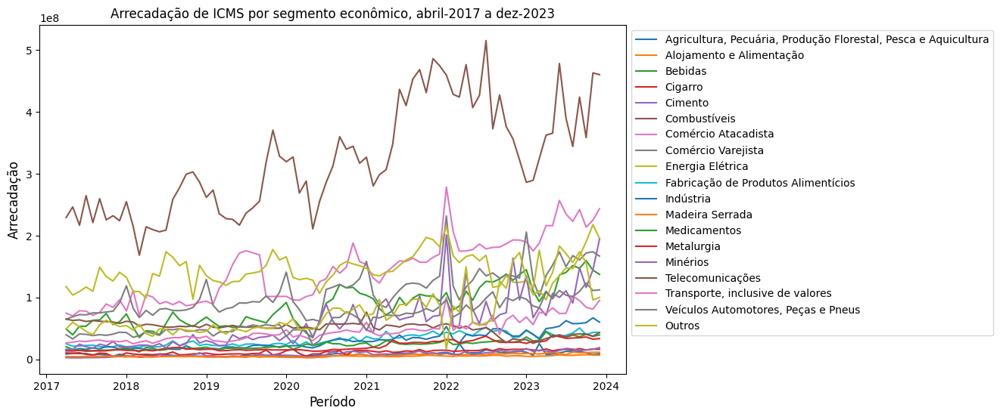

In [ ]:
plt.figure(figsize=(10, 6))

# Plota as linhas para as 20 primeiras colunas
for coluna in serie.iloc[:, :19]:
    plt.plot(serie[coluna], label=coluna)

plt.xlabel('Período', fontsize=12)
plt.ylabel('Arrecadação', fontsize=12)
plt.title('Arrecadação de ICMS por segmento econômico, abril-2017 a dez-2023')

# Adiciona a legenda
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

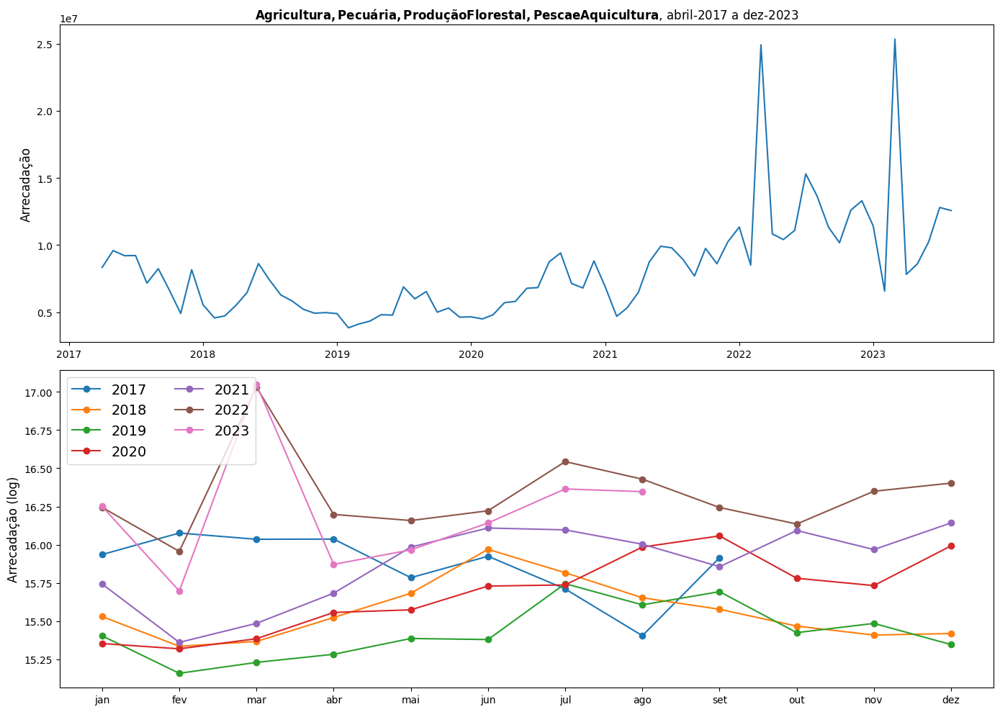

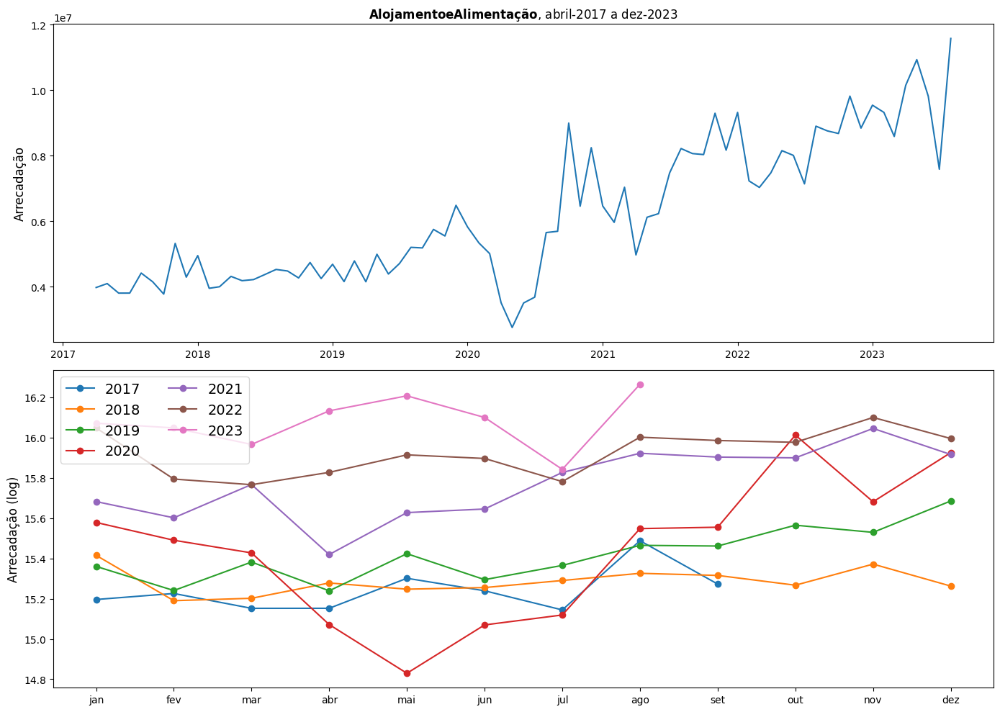

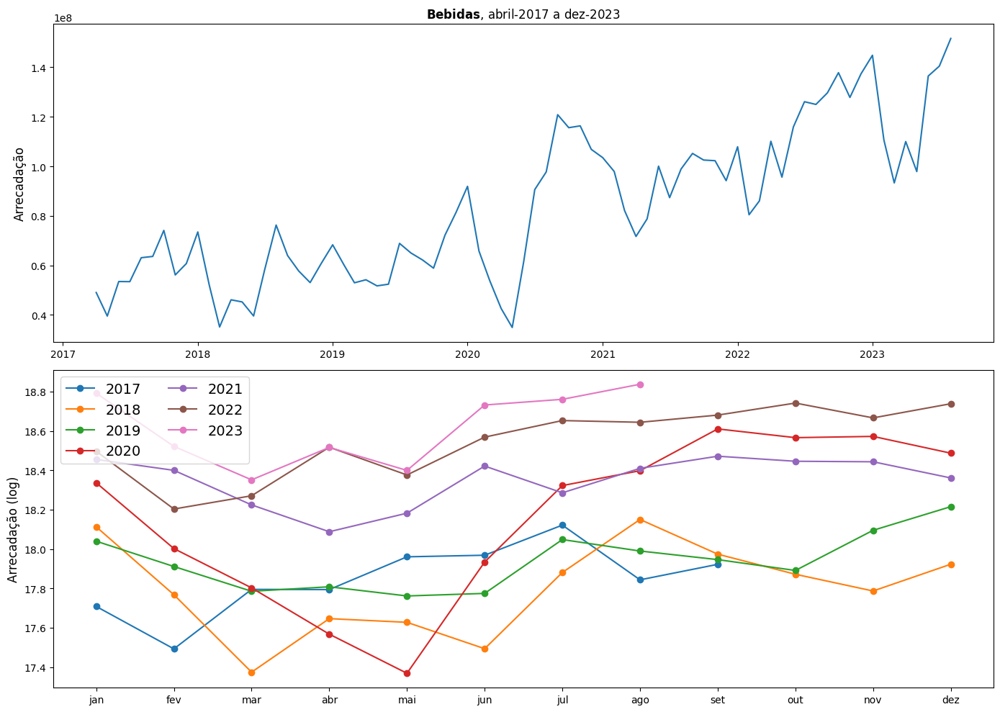

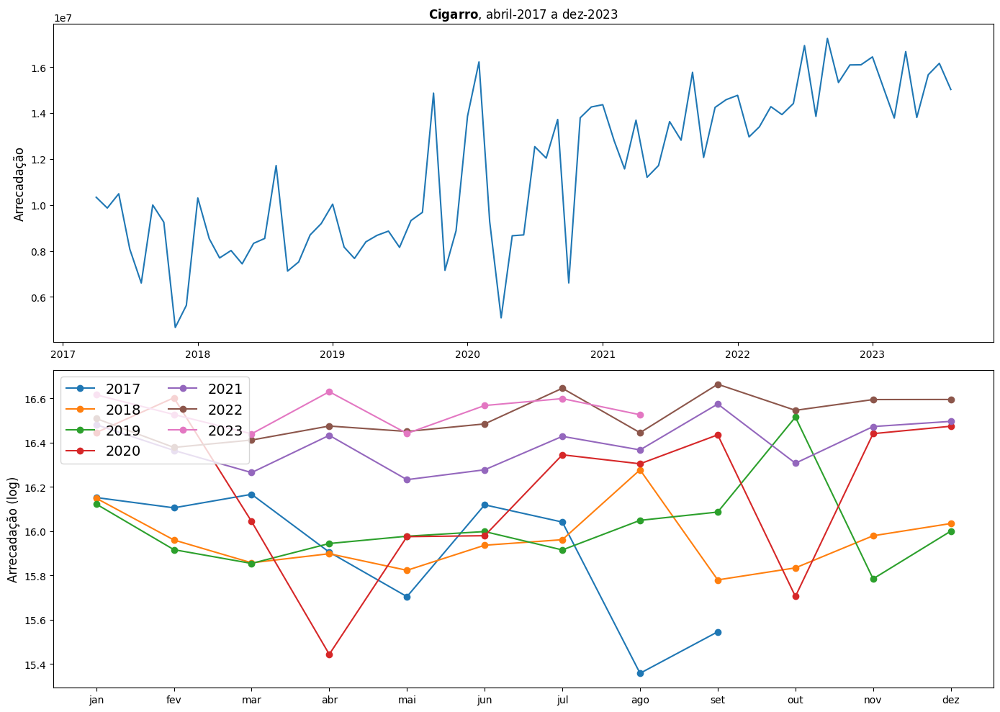

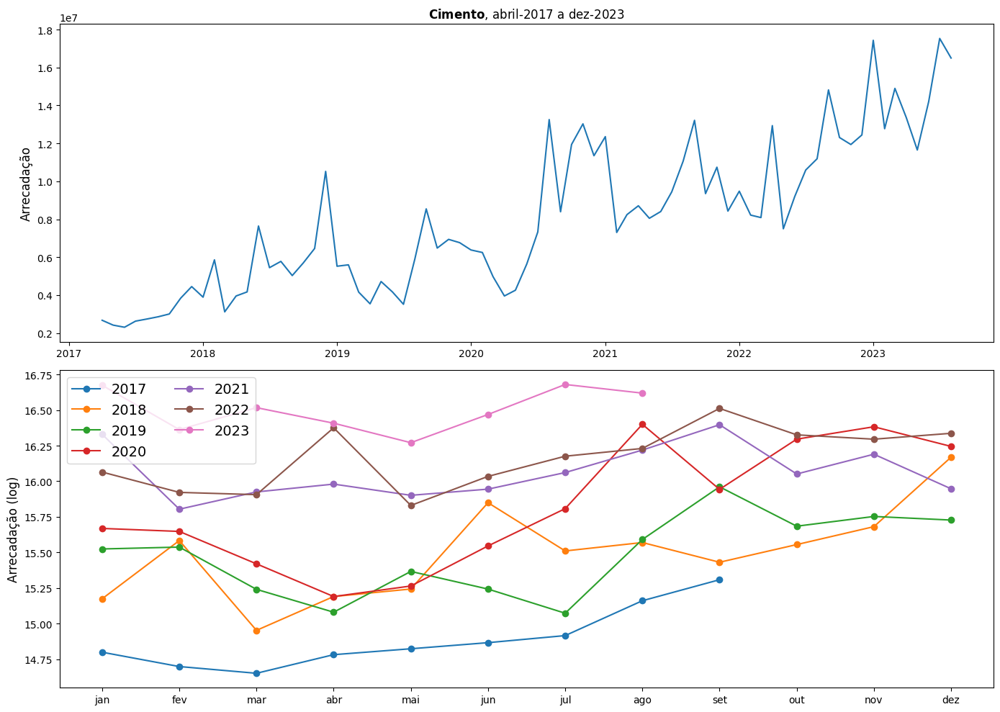

...

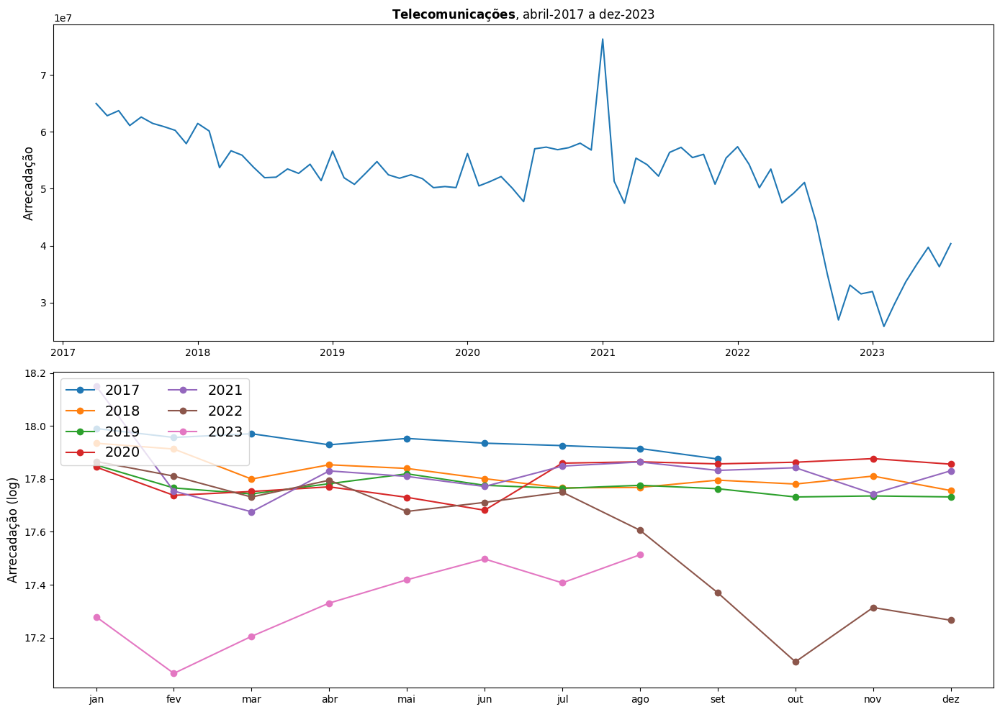

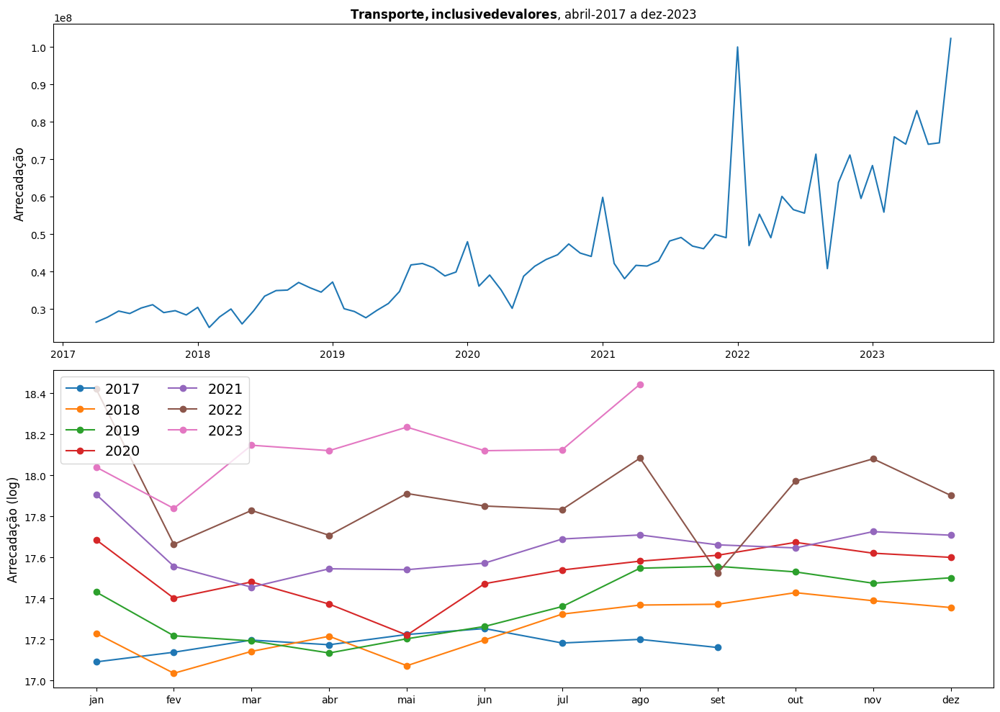

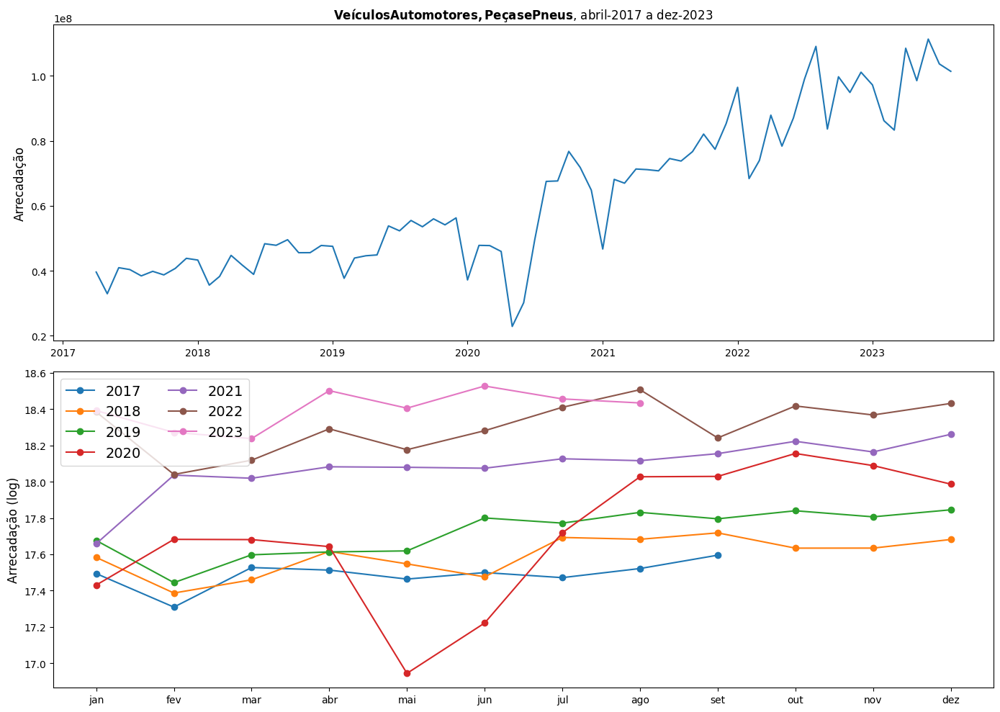

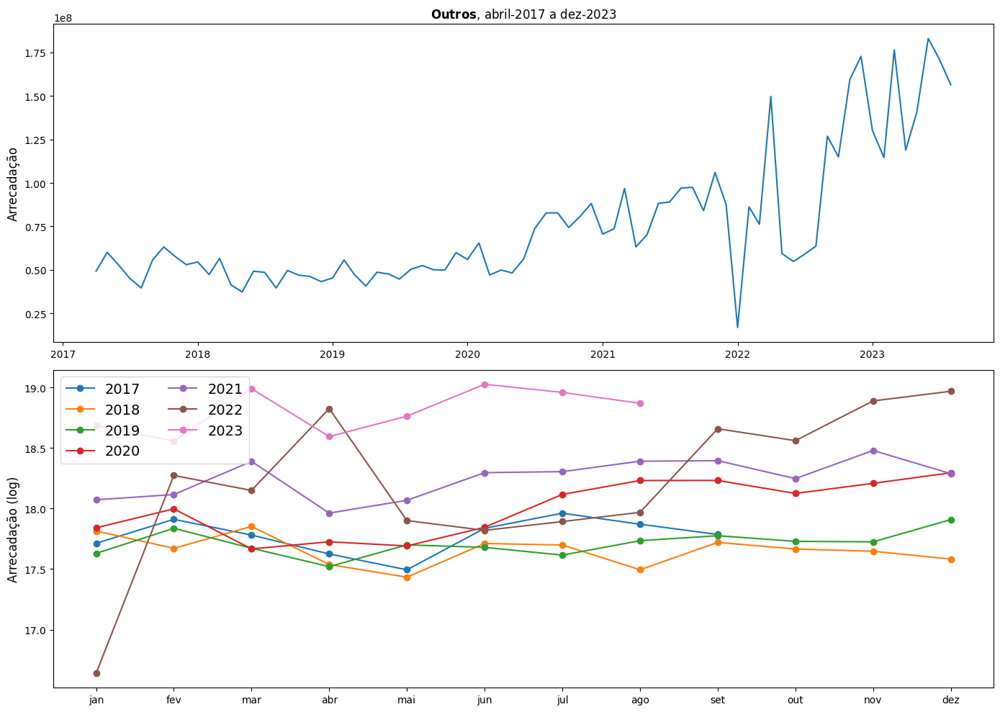

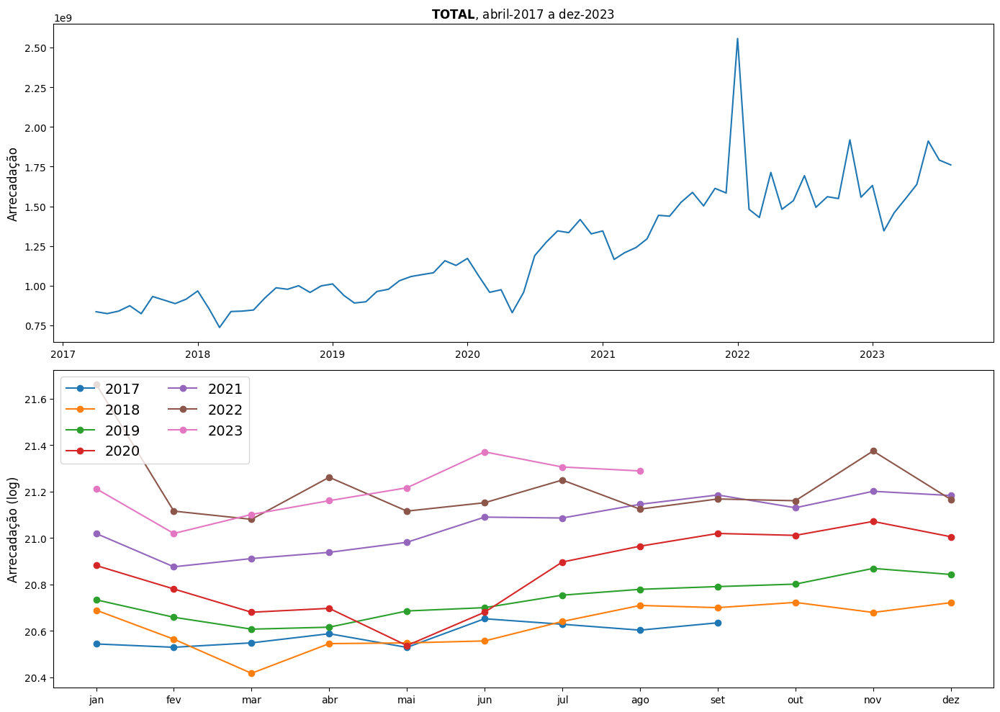

In [ ]:
# Função para gerar os dois gráficos para uma coluna específica
def plotar_graficos(coluna):
    plt.figure(figsize=(14, 10))

    # Primeiro gráfico
    plt.subplot(2, 1, 1)
    plt.plot(serie[coluna])
    plt.xlabel('', fontsize=12)
    plt.ylabel('Arrecadação', fontsize=12)
    plt.title(fr'$\bf{{{coluna}}}$, abril-2017 a dez-2023')

    # Segundo gráfico com aplicação do log
    plt.subplot(2, 1, 2)
    icms = np.log(serie[coluna])
    A = serie[coluna].index.year
    anos = A.unique()

    M = serie[coluna].index.month
    meses = M.unique()
    mesesStr = ['jan', 'fev', 'mar', 'abr', 'mai', 'jun', 'jul', 'ago', 'set', 'out', 'nov', 'dez']

    for i in anos:
        ZtAno = icms[(serie[coluna].index.year == i)]
        nMeses = len(ZtAno)
        plt.plot(mesesStr[:nMeses], ZtAno, 'o-', label=str(i))

    plt.ylabel('Arrecadação (log)', fontsize=12)
    plt.legend(loc='upper left', prop={'size': 14}, ncol=2)

    # Ajusta o layout para evitar sobreposição de rótulos e títulos
    plt.tight_layout()

    # Mostra os gráficos
    plt.show()

# Itera sobre cada coluna da tabela 'serie'
for coluna in serie.columns:
    plotar_graficos(coluna)

#plt.savefig('GráficoMêsICMS.png', format='png')

# Teste de Estacionariedade e Heterocedásticidade

<Figure size 2000x900 with 0 Axes>

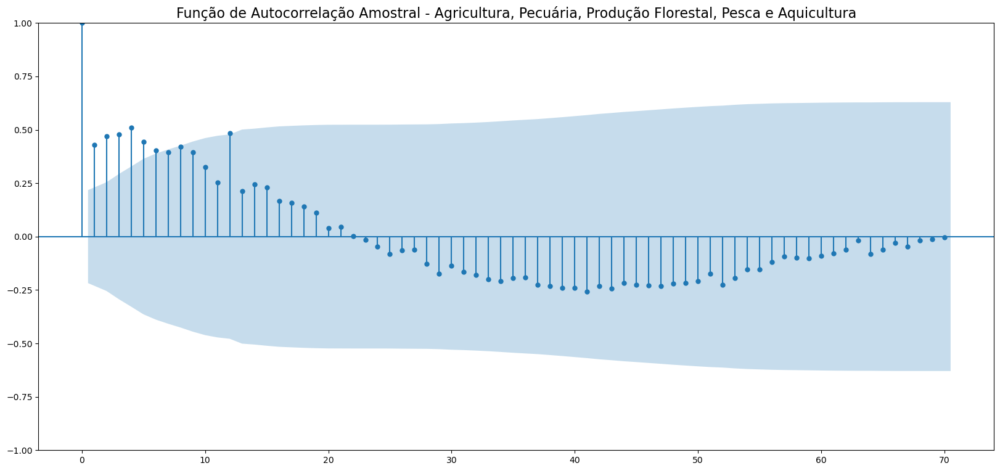

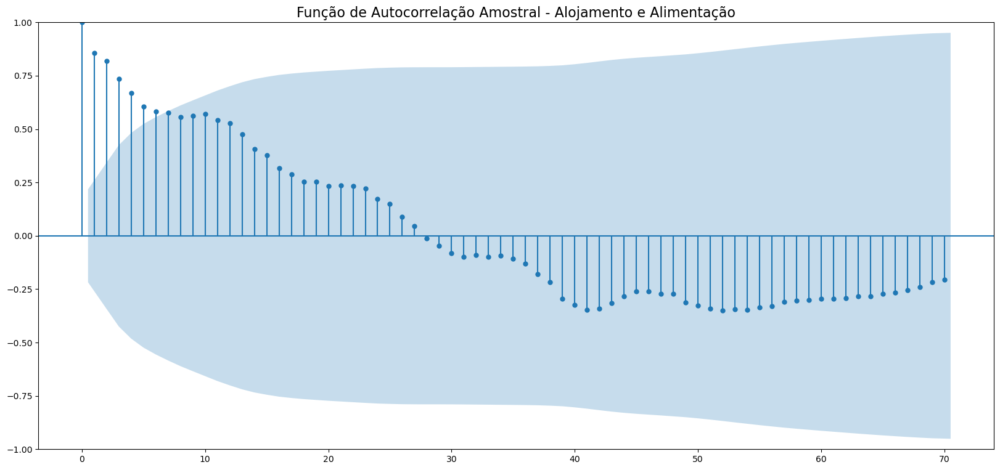

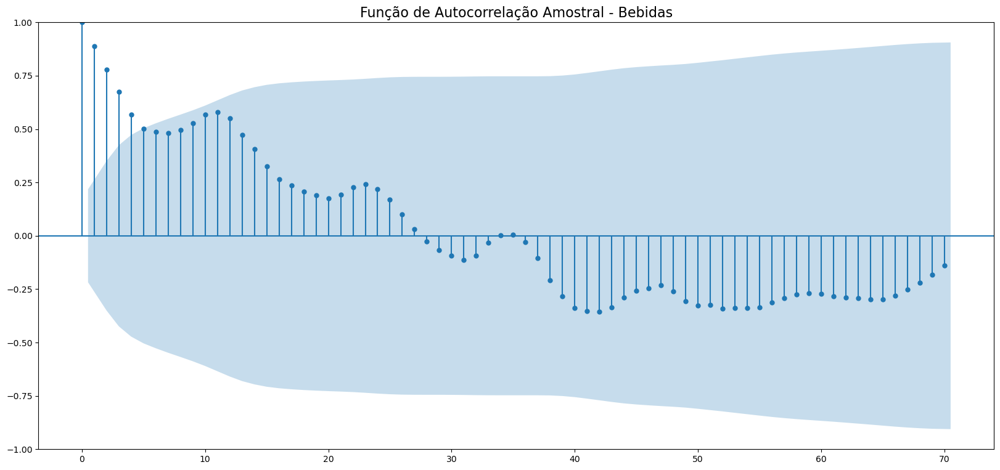

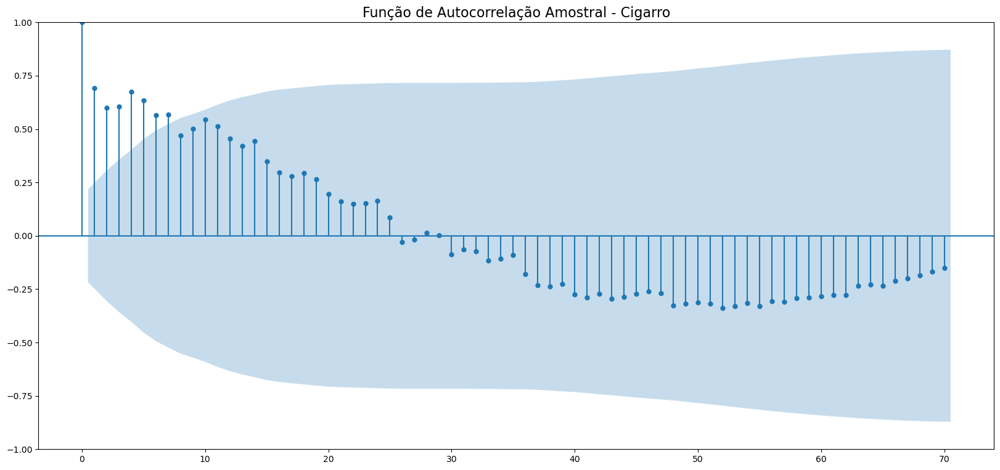

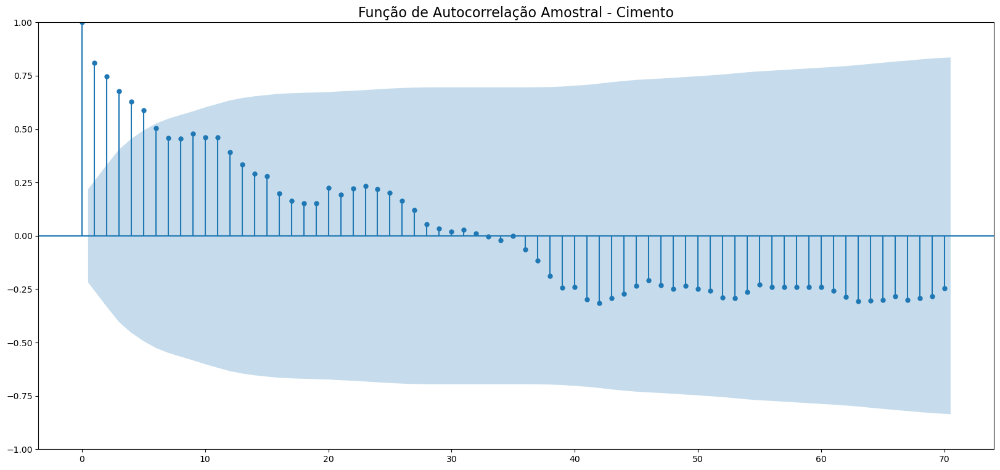

...

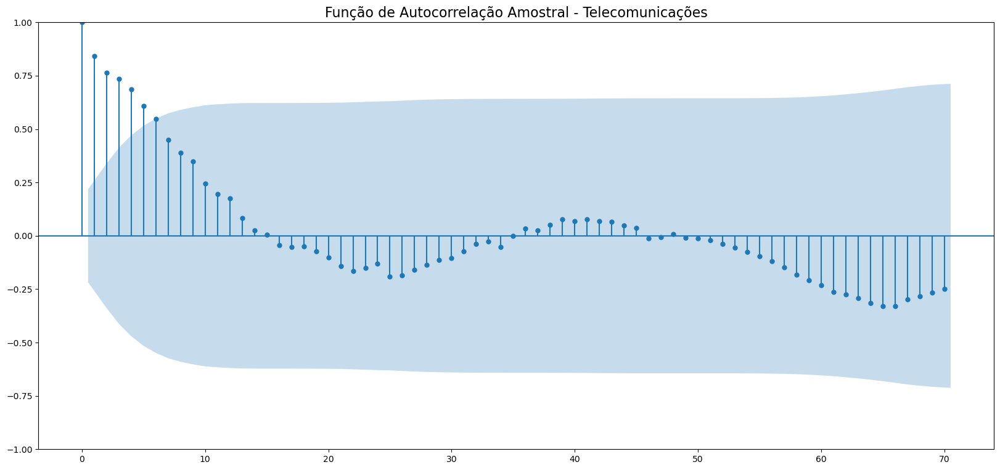

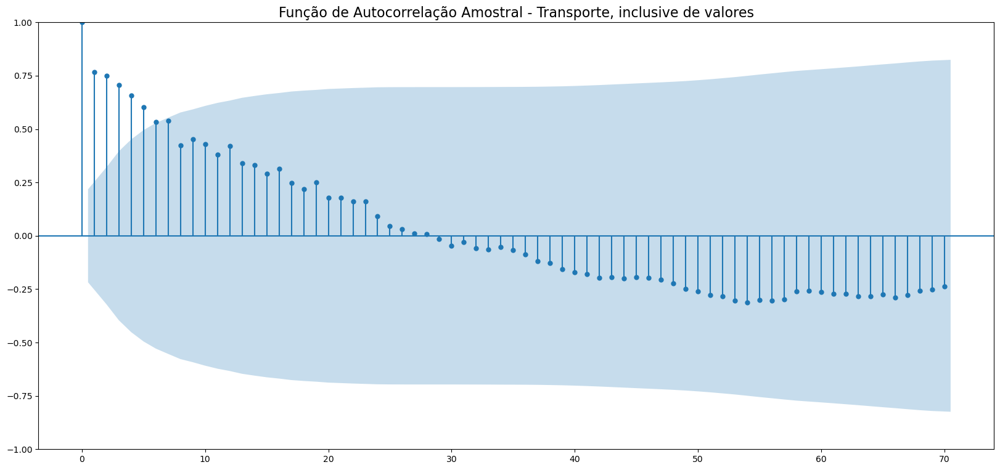

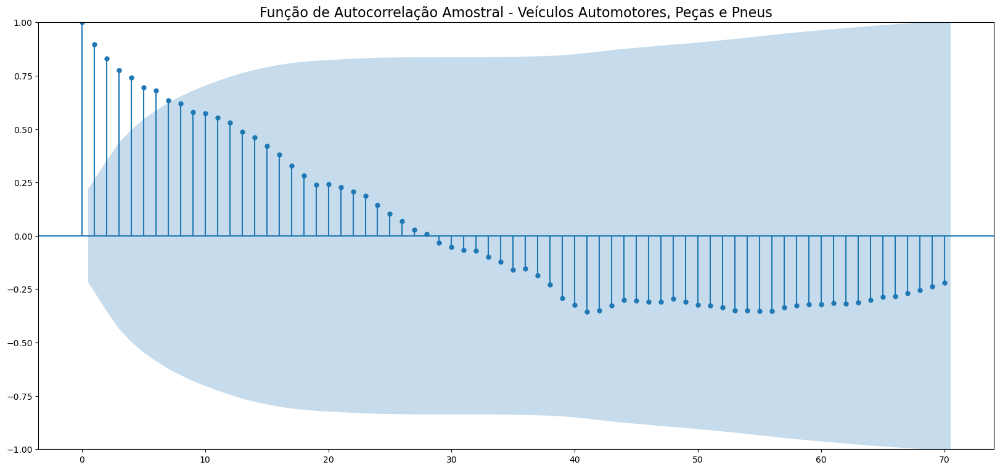

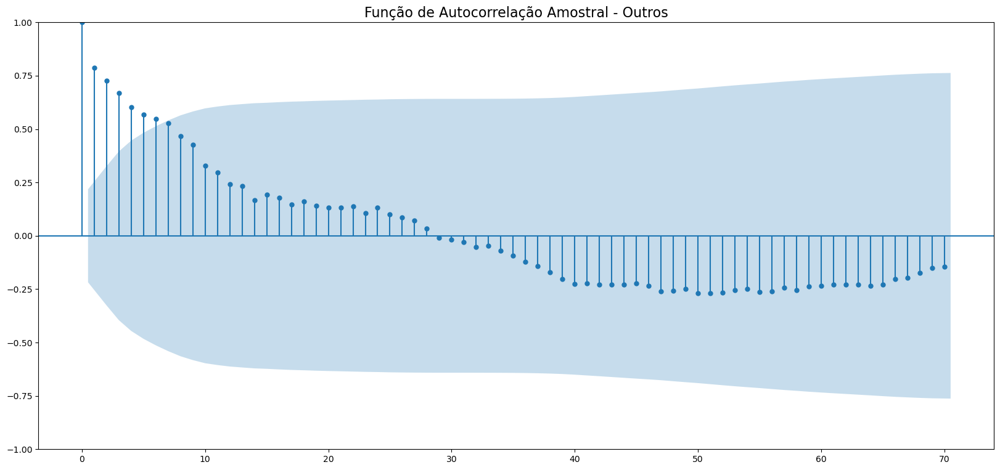

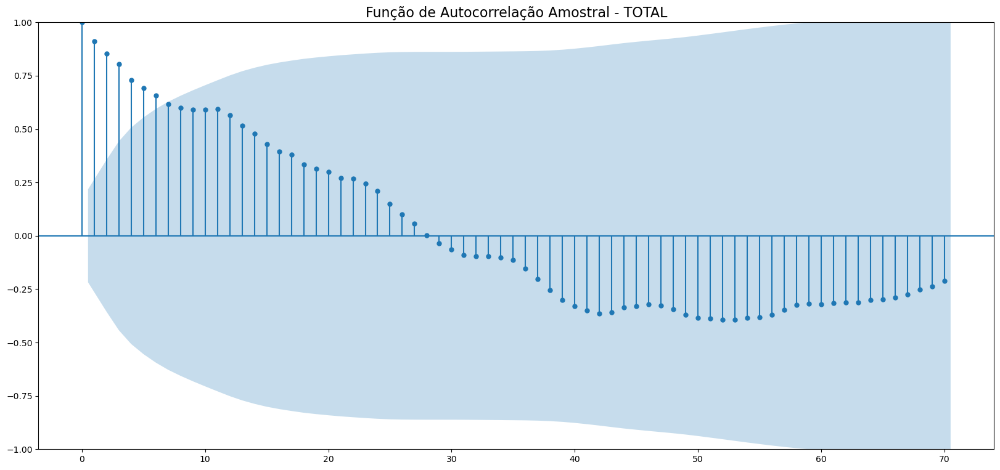

In [ ]:
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

def plot_autocorrelation(data, lags=70, alpha=0.05):
    plt.figure(figsize=(20, 9))
    for column in data.columns:
        plt.figure(figsize=(20, 9))
        ax = plt.subplot()
        plot_acf(data[column], lags=lags, alpha=alpha, ax=ax)
        plt.title(f'Função de Autocorrelação Amostral - {column}', fontsize=16)
        plt.show()

# Supondo que dados_menos_curva seja seu DataFrame
plot_autocorrelation(serie)

In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(data, alpha=0.05):
    for column in data.columns:
        result = adfuller(data[column].dropna(), autolag='AIC')
        print()
        print(f'Resultado: A série temporal da coluna {column} é {"NÃO " if result[1] > alpha else ""}estacionária. Com o p-valor de {result[1]}')
        print()
test_stationarity(serie, 0.05)


Resultado: A série temporal da coluna Agricultura, Pecuária, Produção Florestal, Pesca e Aquicultura é NÃO estacionária. Com o p-valor de 0.7467131297120779


Resultado: A série temporal da coluna Alojamento e Alimentação é NÃO estacionária. Com o p-valor de 0.9979726784775714


Resultado: A série temporal da coluna Bebidas é NÃO estacionária. Com o p-valor de 0.9614452195808231


Resultado: A série temporal da coluna Cigarro é NÃO estacionária. Com o p-valor de 0.9570469576109447


Resultado: A série temporal da coluna Cimento é NÃO estacionária. Com o p-valor de 0.9819667504576808


Resultado: A série temporal da coluna Combustíveis é NÃO estacionária. Com o p-valor de 0.7665644460270217


Resultado: A série temporal da coluna Comércio Atacadista é NÃO estacionária. Com o p-valor de 0.4226549943330333


Resultado: A série temporal da coluna Comércio Varejista é NÃO estacionária. Com o p-valor de 0.997647096138635


Resultado: A série temporal da coluna Energia Elétrica é estacionári

## Removendo tendência com Minimos Quadrados

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

# Função (polinomial) para ajustar a curva de acordo com o método dos mínimos quadrados
#Essa função curve_fit_func é responsável por avaliar um polinômio dado um conjunto de parâmetros e um ponto ou conjunto de pontos.
def curve_fit_func(x, *params):
    return np.polyval(params, x)

# Função para remover a tendência de uma coluna
def remove_trend(column):
    x = np.arange(len(column))
    #Estamos inicializando um array de zeros chamado initial_guess com o mesmo tamanho que a coluna.
    #Esse array será usado como um palpite inicial para os parâmetros do ajuste da curva.
    initial_guess = np.zeros(grau)
    #curve_fit é uma função do SciPy que ajusta uma função a dados usando o método dos mínimos quadrados não lineares.
    #curve_fit_func é a função que define o modelo da curva a ser ajustada.
    #x são os pontos nos quais os dados são observados (índices da coluna)
    #p0 é o palpite inicial para os parâmetros do modelo,
    popt, _ = curve_fit(curve_fit_func, x, column, p0=initial_guess)
    #curve_fit_func para calcular a curva de tendência usando os parâmetros ótimos (popt) encontrados pelo ajuste de curva.
    trend = curve_fit_func(x, *popt) #A própria curva de tendência.
    detrended_column = column - trend #A coluna de dados original menos a tendência calculada.
    return detrended_column, trend

# Função para remover a tendência de uma coluna
def remove_trend_dados(column):
    x = np.arange(len(column))
    initial_guess = np.zeros(grau)  # Palpite inicial para os parâmetros do ajuste da curva
    popt, _ = curve_fit(curve_fit_func, x, column, p0=initial_guess)

    trend = curve_fit_func(x, *popt)
    parametros = popt.tolist()

    return trend, parametros

In [ ]:
curvas = pd.DataFrame(index=serie.index, columns=serie.columns) #matriz para armazenar os dados de curva
dados_menos_curva = serie.copy()
grau = 8

i = 0
for col in serie.columns:

    trend, parametros = remove_trend_dados(serie[col])

    a = parametros # SALVANDO OS PARÂMETROS
    exec(f"parametros{i} = a")
    i = i + 1

    curvas[col] = trend[:len(serie)] # SALVANDO AS CURVAS

dados_menos_curva -= curvas

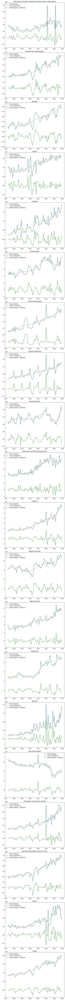

In [ ]:
serieT = serie.copy()
# Configurações para o plot
num_cols = len(serieT.columns)
fig, axs = plt.subplots(num_cols, 1, figsize=(8, 6*num_cols))

# Aplicar a remoção de tendência e plotar para cada coluna
for i, col in enumerate(serieT.columns):
    detrended_data, trend = remove_trend(serieT[col])
    axs[i].plot(serieT.index, serieT[col], label='Dados Originais')
    axs[i].plot(serieT.index, trend, label='Curva de Tendência', linestyle='--')
    axs[i].plot(serieT.index, detrended_data, label='Dados Originais - Tendência')
    axs[i].legend()
    axs[i].set_title(f'{col}')

plt.tight_layout()
plt.show()

## Teste de ESTACIONÁRIEDADE depois de remover a tendência

In [ ]:
from statsmodels.tsa.stattools import adfuller

def test_stationarity(data, alpha=0.05):
    for column in data.columns:
        result = adfuller(data[column].dropna(), autolag='AIC')
        print()
        print(f'Resultado: A série temporal da coluna {column} é {"não " if result[1] > alpha else ""}estacionária. Com o p-valor de {result[1]}')
        print()
test_stationarity(dados_menos_curva, 0.05)



Resultado: A série temporal da coluna Agricultura, Pecuária, Produção Florestal, Pesca e Aquicultura é estacionária. Com o p-valor de 0.0031678231186393698


Resultado: A série temporal da coluna Alojamento e Alimentação é estacionária. Com o p-valor de 4.903454598915378e-09


Resultado: A série temporal da coluna Bebidas é estacionária. Com o p-valor de 0.0036269558885334277


Resultado: A série temporal da coluna Cigarro é estacionária. Com o p-valor de 6.839695589129339e-06


Resultado: A série temporal da coluna Cimento é estacionária. Com o p-valor de 1.7640081638656391e-06


Resultado: A série temporal da coluna Combustíveis é estacionária. Com o p-valor de 1.8862747891240256e-07


Resultado: A série temporal da coluna Comércio Atacadista é estacionária. Com o p-valor de 4.714796586197297e-05


Resultado: A série temporal da coluna Comércio Varejista é estacionária. Com o p-valor de 0.01267018127362226


Resultado: A série temporal da coluna Energia Elétrica é estacionária. Com 

## Teste de  heterocedasticidade

In [ ]:
def ZxW(x, nWindowsSamples):
    nSamples = len(x)

    if nSamples % nWindowsSamples == 0:
        nWindows = nSamples/nWindowsSamples
    else:
        nWindows = math.floor(nSamples/nWindowsSamples) + 1

    barZ = np.zeros((nWindows, 1))
    ampZ = np.zeros((nWindows, 1))
    stdZ = np.zeros((nWindows, 1))

    t = 0

    for i in range(0, nWindows):

        if i == nWindows - 1:
            barZ[i] = np.mean(x.iloc[t:])
            ampZ[i] = np.abs(np.max(x.iloc[t:]) - np.min(x.iloc[t:]))
            stdZ[i] = np.std(x.iloc[t:])
        else:
            barZ[i] = np.mean(x.iloc[t:t + nWindowsSamples])
            ampZ[i] = np.abs(np.max(x.iloc[t:t + nWindowsSamples]) - np.min(x.iloc[t:t + nWindowsSamples]))
            stdZ[i] = np.std(x.iloc[t:t + nWindowsSamples])

        t = t + nWindowsSamples

    return barZ, ampZ, stdZ

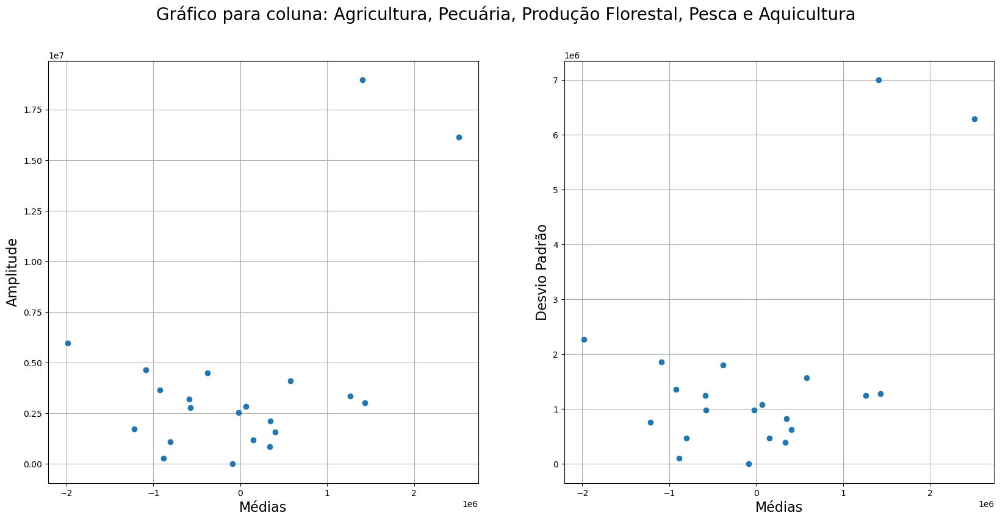

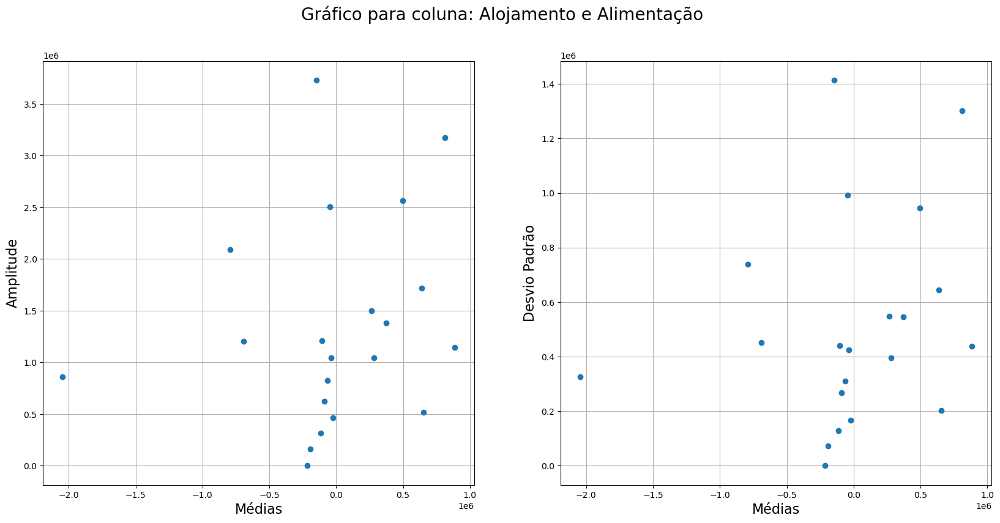

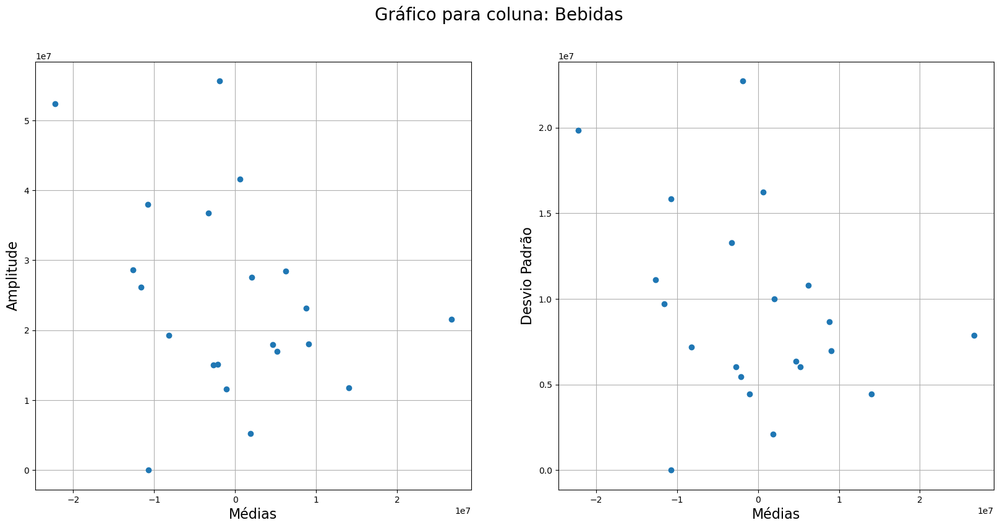

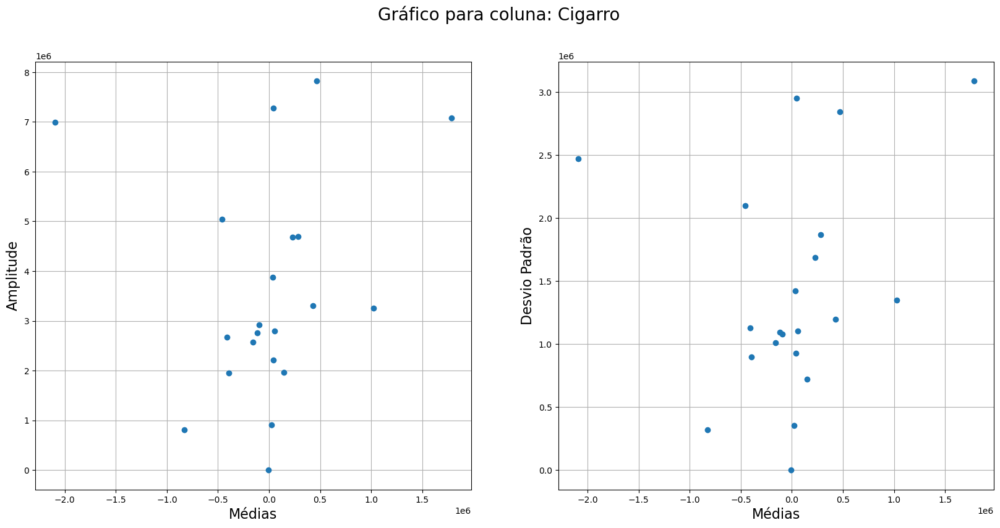

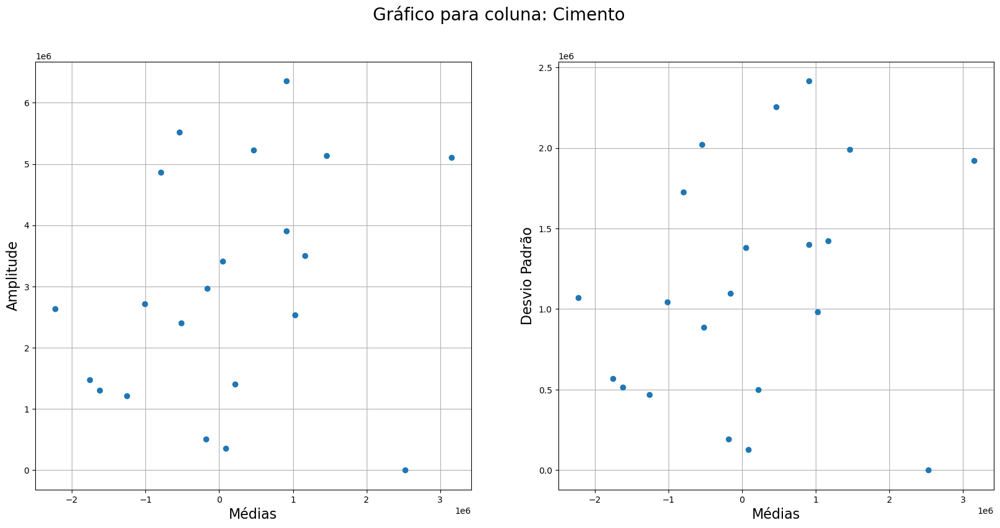

...

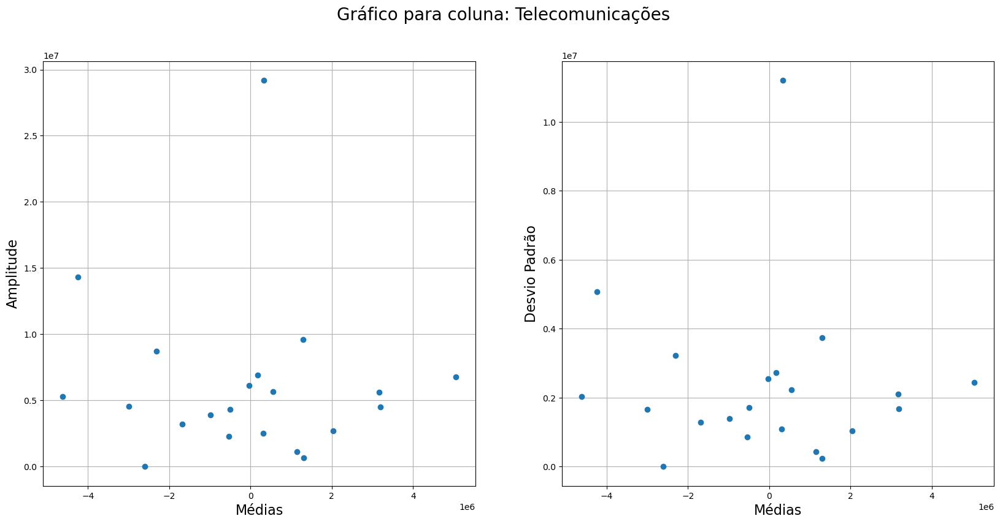

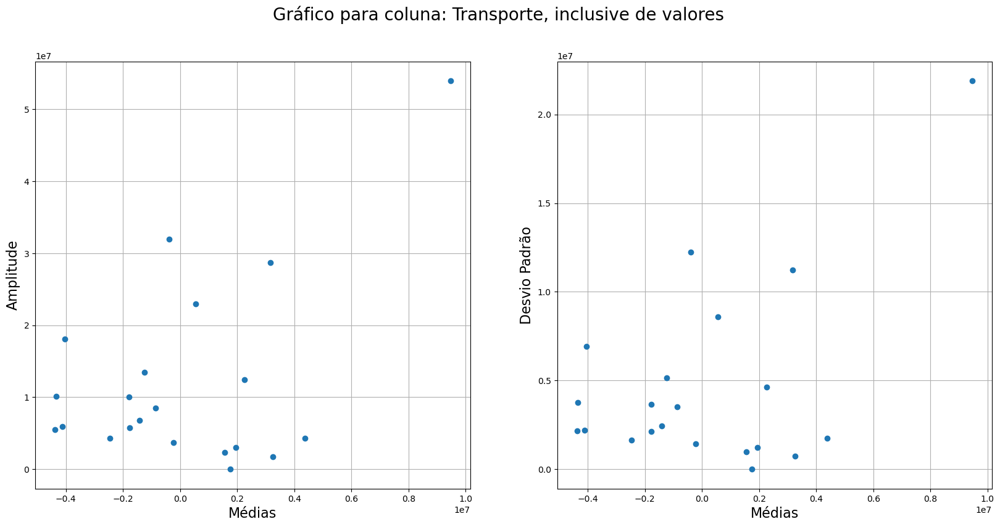

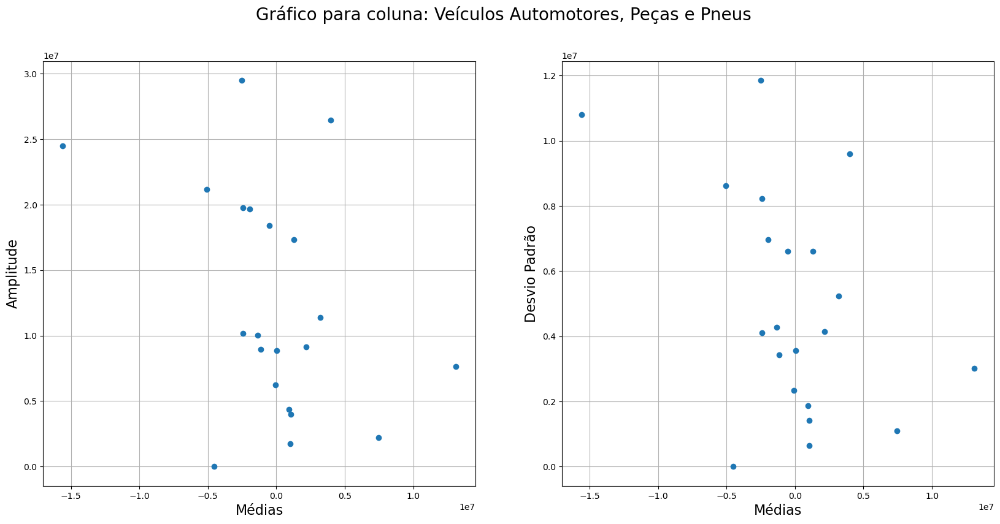

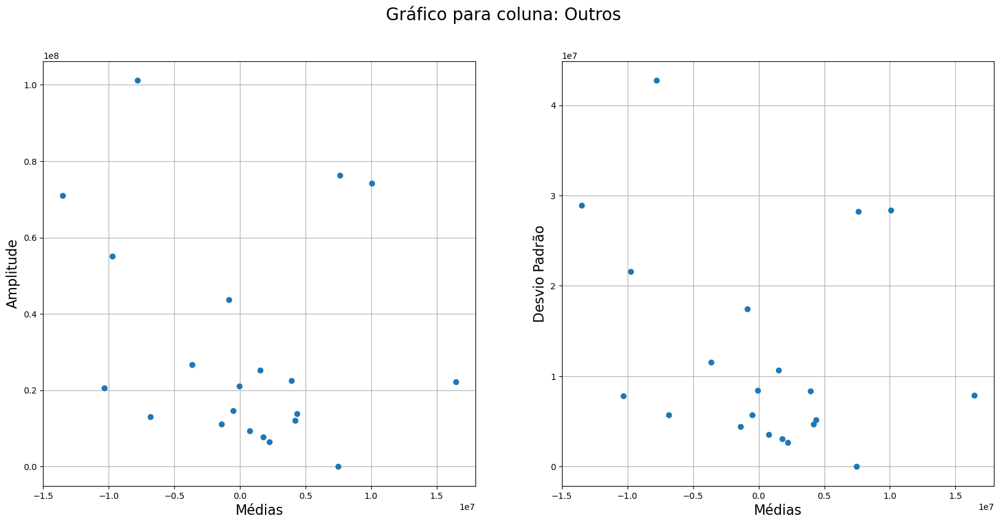

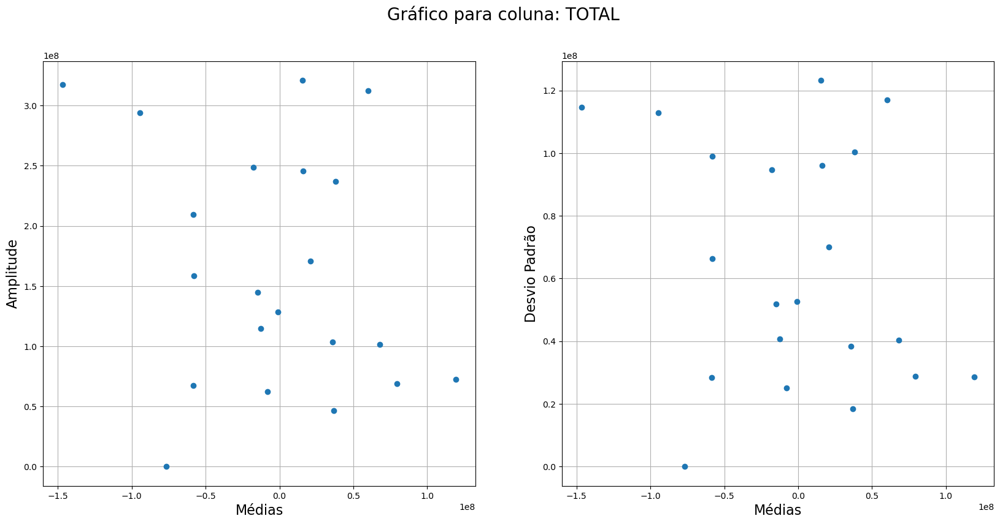

In [ ]:
import math
def plot_ZxW(data, nWindowsSamples):
    for column in data.columns:
        barZ, ampZ, stdZ = ZxW(data[column], nWindowsSamples)

        plt.figure(figsize=(20, 9))

        plt.subplot(1, 2, 1)
        plt.plot(barZ, ampZ, 'o')
        plt.grid(True)
        plt.xlabel('Médias', fontsize=16)
        plt.ylabel('Amplitude', fontsize=16)

        plt.subplot(1, 2, 2)
        plt.plot(barZ, stdZ, 'o')
        plt.grid(True)
        plt.xlabel('Médias', fontsize=16)
        plt.ylabel('Desvio Padrão', fontsize=16)

        plt.suptitle(f'Gráfico para coluna: {column}', fontsize=20)
        plt.show()

# Supondo que dados_menos_curva seja seu DataFrame e nWindowsSamples seja o número de amostras por janela
plot_ZxW(dados_menos_curva, 4)

Como as medidas não tem uma relação clara, não será preciso fazer o log das variáveis.

# Separação de TREINO e TESTE

In [ ]:
nSamples = len(serie) # Número total de amostras na série.
nTestSamples = 6     # Número de amostras definidas para teste. Nesse caso, 12 amostras.
nModelSamples = nSamples - nTestSamples     # Número de amostras definidas para modelagem

ZtModel = serie.iloc[:nModelSamples]
ZtTest = serie.iloc[nModelSamples:]

print(f'Número de amostras: {nSamples}')
print(f'Número de amostras para modelagem: {nModelSamples}')
print(f'Número de amostras para teste: {nTestSamples}')
print(f'Os dados de modelagem começam em {ZtModel.index[0].year}-{ZtModel.index[0].month}-{ZtModel.index[0].day} e terminam em {ZtModel.index[nModelSamples - 1].year}-{ZtModel.index[nModelSamples - 1].month}-{ZtModel.index[nModelSamples - 1].day}.')
print(f'Os dados de teste começam em {ZtTest.index[0].year}-{ZtTest.index[0].month}-{ZtTest.index[0].day} e terminam em {ZtTest.index[nTestSamples - 1].year}-{ZtTest.index[nTestSamples - 1].month}-{ZtTest.index[nTestSamples - 1].day}.')

Número de amostras: 81
Número de amostras para modelagem: 75
Número de amostras para teste: 6
Os dados de modelagem começam em 2017-4-1 e terminam em 2023-6-1.
Os dados de teste começam em 2023-7-1 e terminam em 2023-12-1.


# Identificação/Especificação de *p*, *q*, *P*, *D* e *Q*.

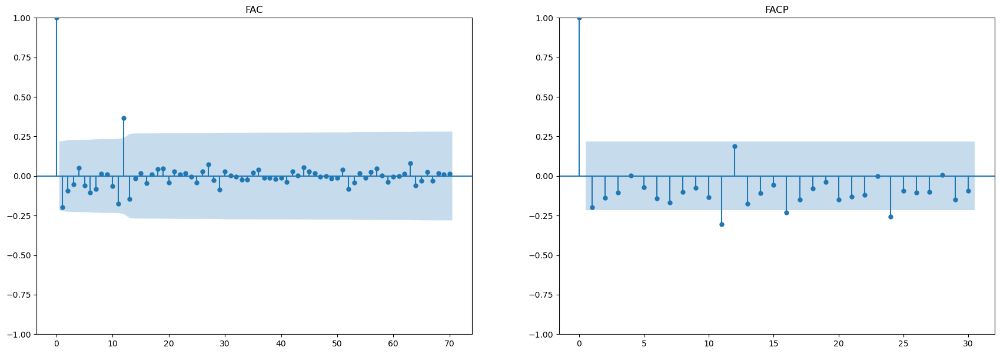

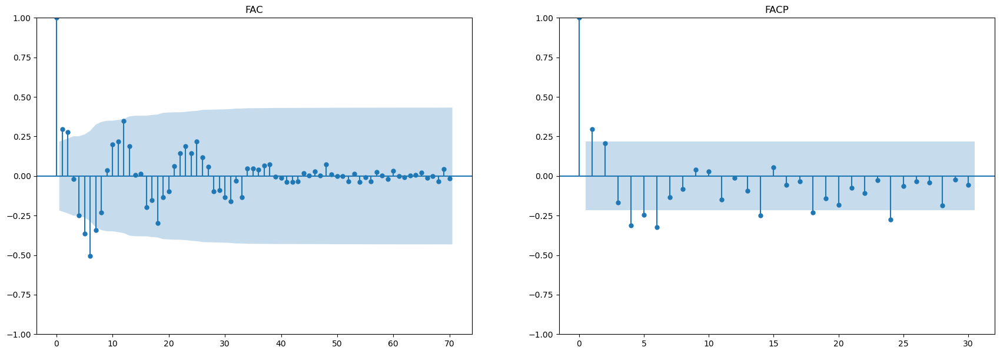

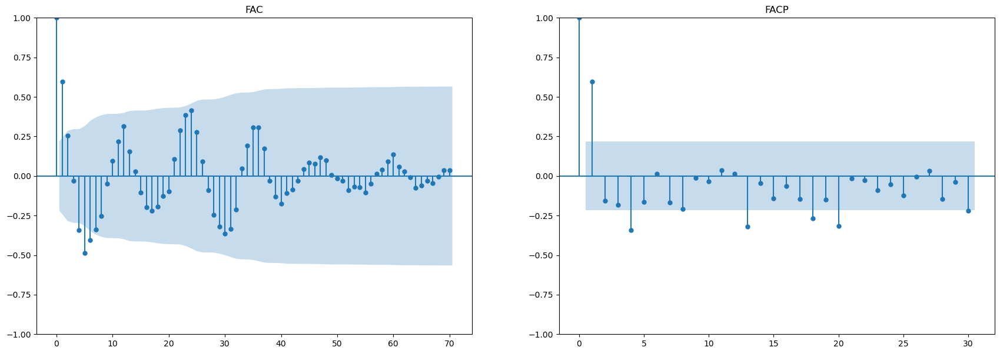

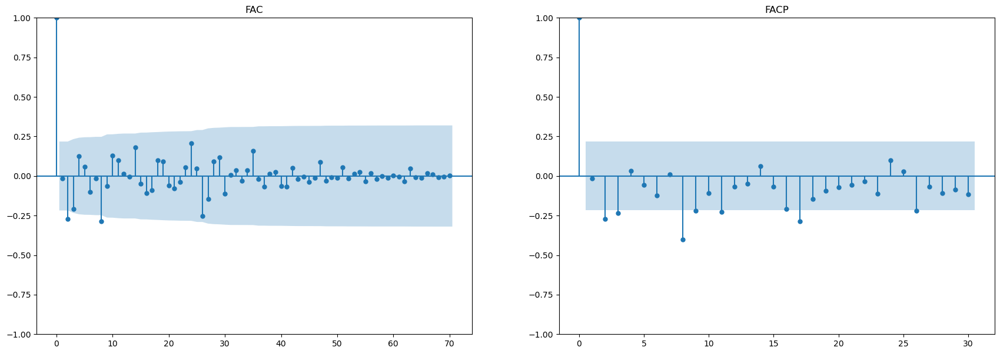

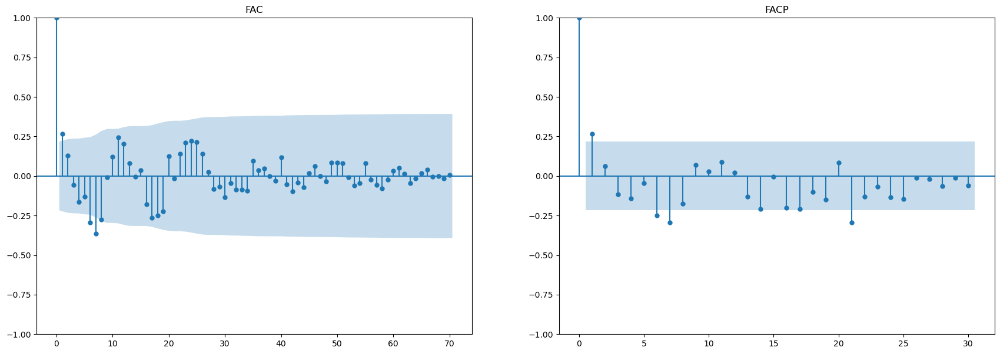

...

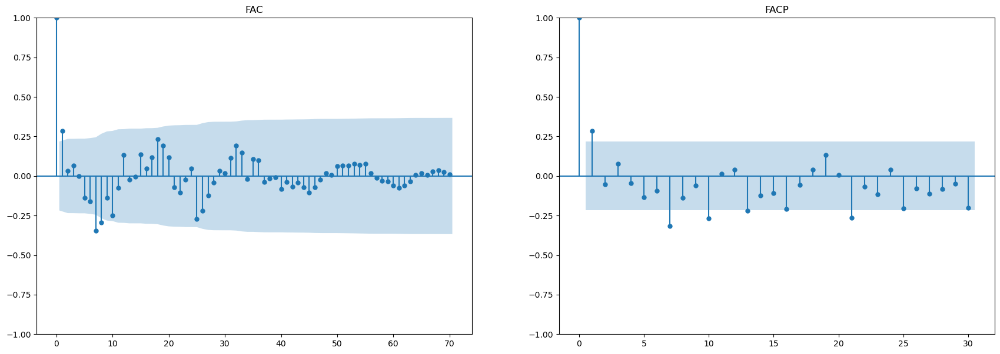

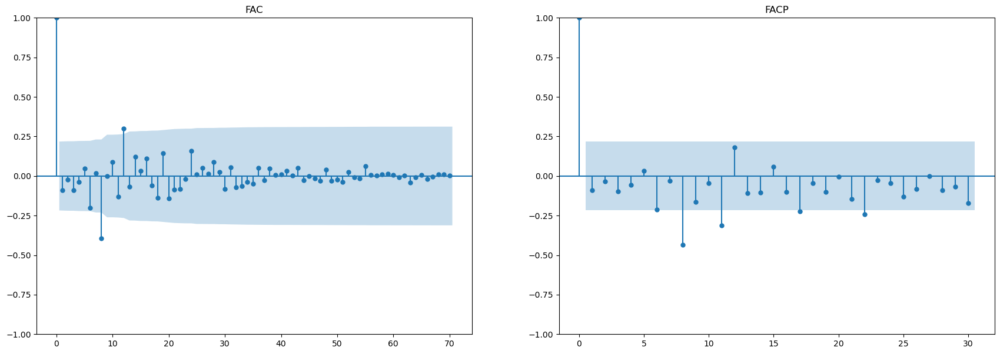

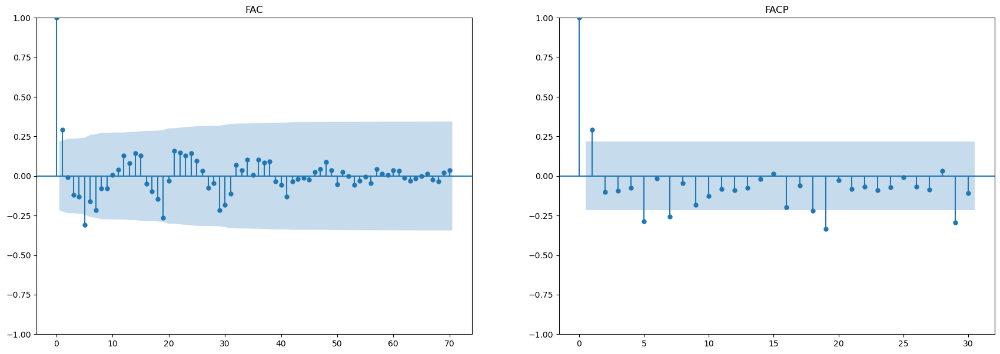

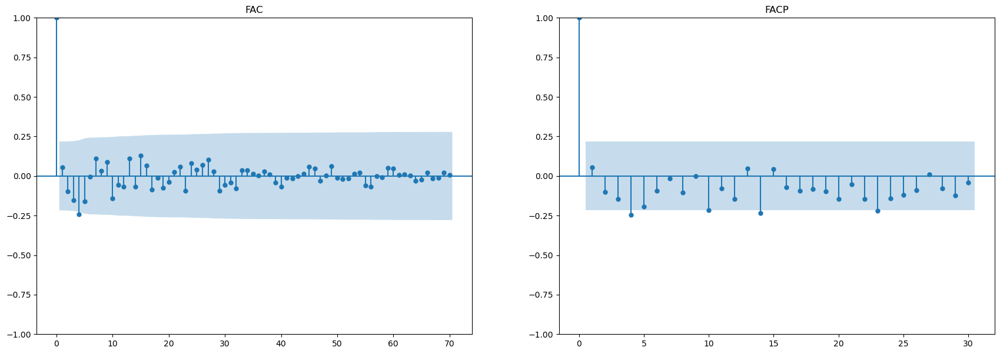

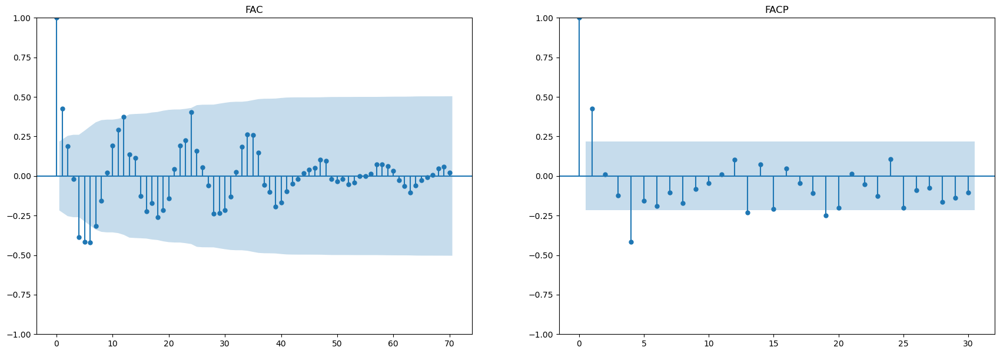

In [ ]:
for i in dados_menos_curva:
    plt.figure(figsize = (21, 7))

    ax1 = plt.subplot(1,2,1)
    plot_acf(dados_menos_curva[i].values, lags=70, title = 'FAC',  alpha = 0.05, ax = ax1)

    ax2 = plt.subplot(1,2,2)
    plot_pacf(dados_menos_curva[i].values, lags=30, title = 'FACP',  alpha = 0.05, ax = ax2)

    plt.show()

## Funções

In [ ]:
def find_best_sarima_parameters(ordens, seasonal_ordens, data, steps):
    """
    Encontra os melhores parâmetros para um modelo SARIMA com base no critério AIC.

    Parâmetros:
    ordens (list of tuples): Lista de tuplas onde cada tupla contém os parâmetros (p, d, q) para o modelo SARIMA.
    seasonal_ordens (list of tuples): Lista de tuplas onde cada tupla contém os parâmetros sazonais (P, D, Q) para o modelo SARIMA.
    data (pd.Series): Série temporal de dados para ajustar o modelo.
    steps (int): Número de passos à frente para prever.

    Retorna:
    tuple: Contém três elementos:
        - best_params (tuple): Parâmetros (p, d, q, P, D, Q) que resultaram no menor valor de AIC.
        - best_aic (float): O menor valor de AIC obtido.
        - best_forecast (pd.Series): Previsões do modelo com os melhores parâmetros.
    """
    best_params = None
    best_aic = np.inf
    best_forecast = None
    residuals = None

    # Itera sobre todas as combinações de parâmetros fornecidos
    for ordem in ordens:
        for seasonal_ordem in seasonal_ordens:
            p, d, q = ordem
            P, D, Q = seasonal_ordem

            try:
                # Ajusta o modelo SARIMA com os parâmetros atuais
                model = SARIMAX(data, order=(p, d, q), seasonal_order=(P, D, Q, 12))
                result = model.fit()
                aic = result.aic

                # Verifica se o AIC atual é menor que o melhor AIC encontrado até agora
                if aic < best_aic:
                    best_aic = aic
                    best_params = (p, d, q, P, D, Q)
                    best_forecast = result.forecast(steps=steps)
                    residuals = result.resid

            except:
                # Continua se houver uma exceção na adaptação do modelo
                continue

    # Plota a função de autocorrelação dos resíduos se disponíveis
    if residuals is not None:
        plot_acf(residuals)
        plt.title('Função de Autocorrelação dos Resíduos')
        plt.show()

    return best_params, best_aic, best_forecast


In [ ]:
#Cria a imagem da previsão vs teste
def plot_forecast(dataTeste, forecast, best_params, name, figsize=(16, 9)):
    plt.figure(figsize=figsize)

    plt.plot(dataTeste, 'r-', label='Dados para Teste')
    plt.plot(forecast, 'b--', label=f'SARIMA{best_params}')
    plt.title(name, fontsize=10)

    legenda = ('Dados para Teste', f'SARIMA{best_params}12')
    plt.legend(legenda, loc='upper center', prop={'size': 14})

    for i, valor in enumerate(forecast):
        plt.text(i, valor, f'{valor:.2f}', fontsize=10, ha='center', va='bottom')

    plt.show()

In [ ]:
def find_and_plot_best_params_for_each_column(ZtModel, ZtTest, ordens, seasonal_ordens, steps):
    forecasts = {}  # Dicionário para armazenar os resultados de cada previsão

    for i, coluna in enumerate(ZtModel.columns):
        predictions_name = f"predictions{i}"
        print(predictions_name)
        exec(f"{predictions_name} = []") # Armazenar as previsões futuras
        data_treino = ZtModel[coluna]
        data_teste = ZtTest[coluna]

        best_params, _, forecast = find_best_sarima_parameters(ordens, seasonal_ordens, data_treino, data_teste, steps)
        eval(f"{predictions_name}.append(forecast.values)")

        # Armazenar o forecast no dicionário
        forecasts[coluna] = forecast.values

        plot_forecast(data_teste.values, forecast.values, best_params, name=data_teste.name)

    return forecasts

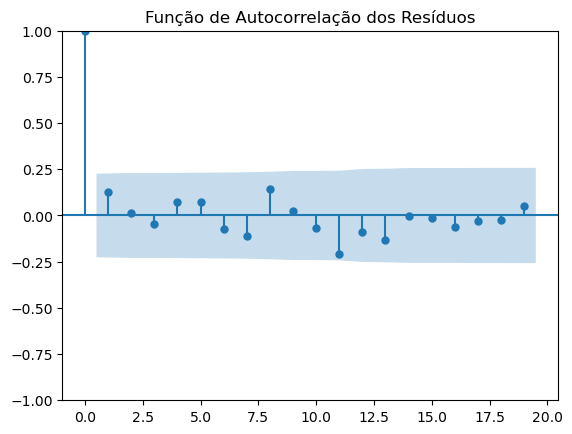

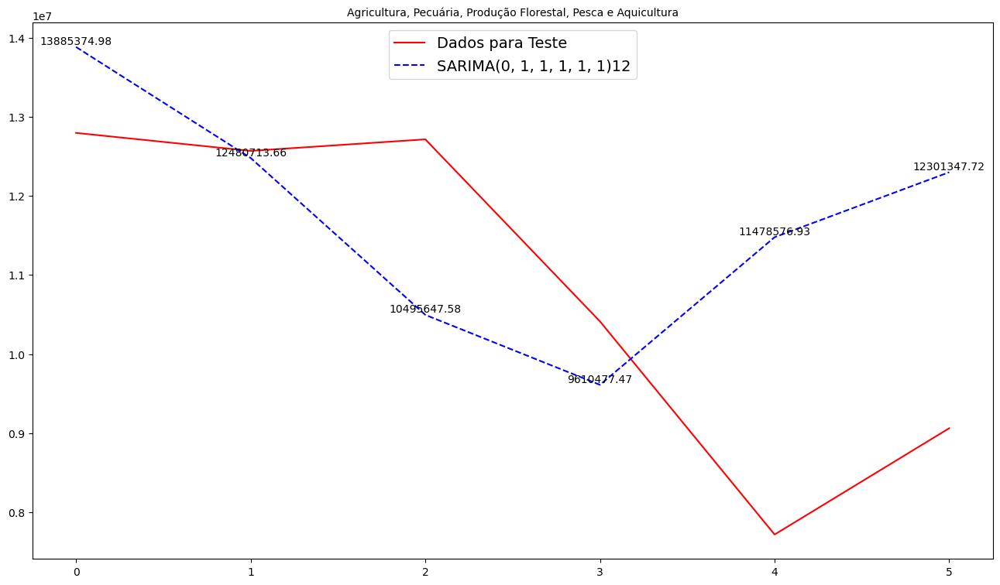

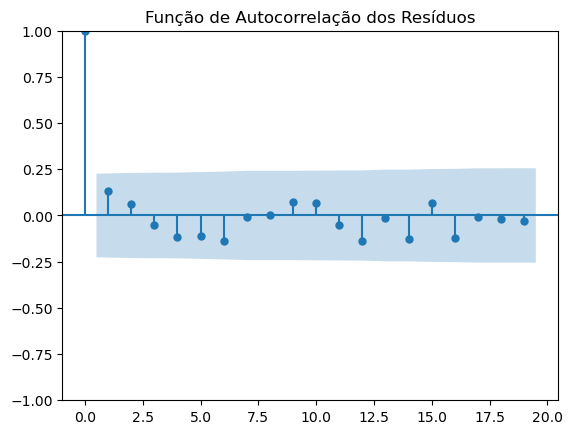

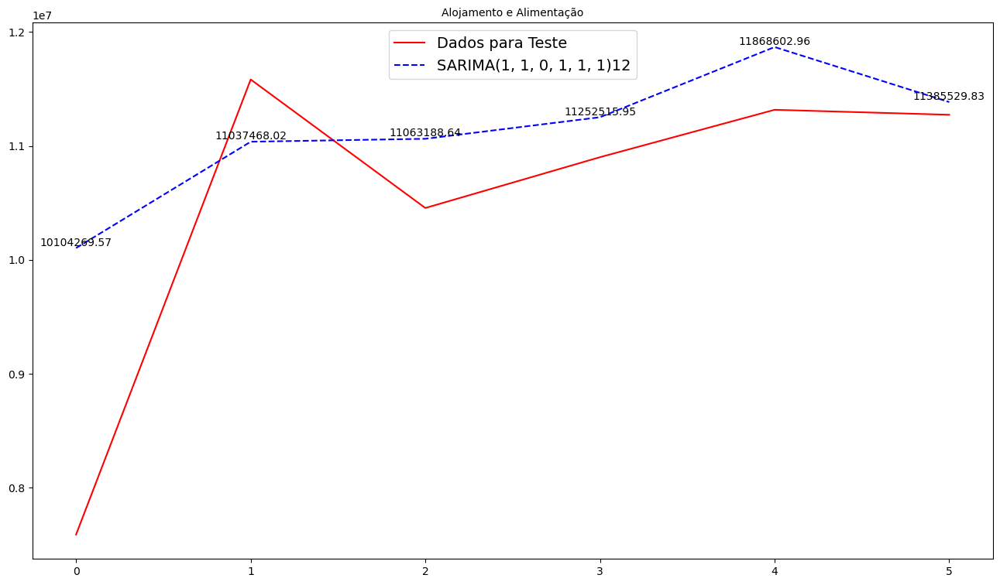

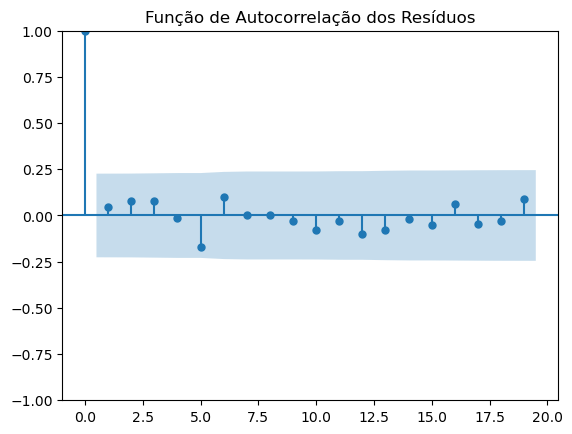

...

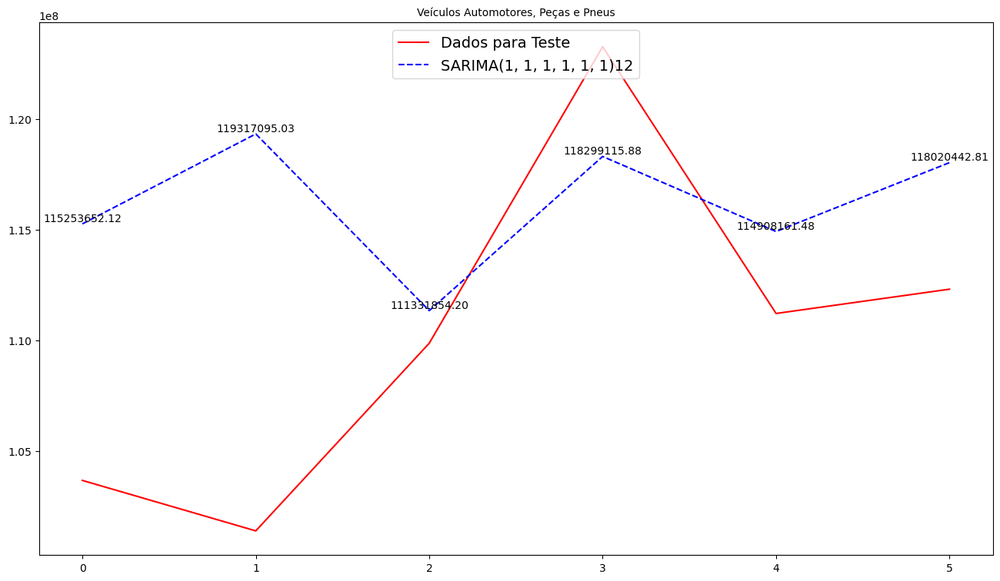

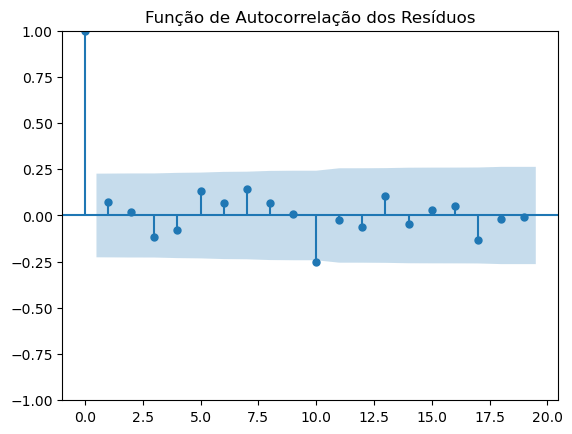

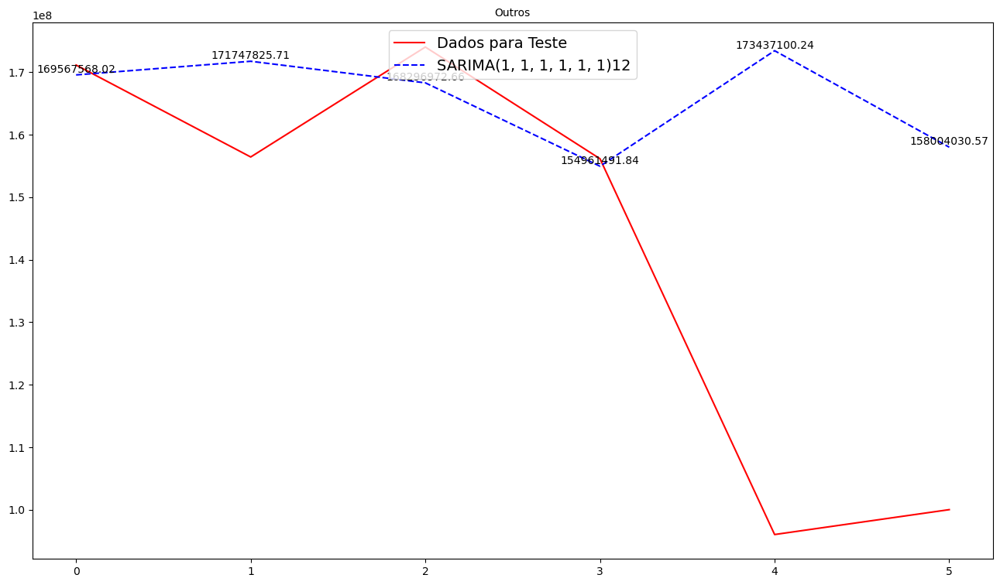

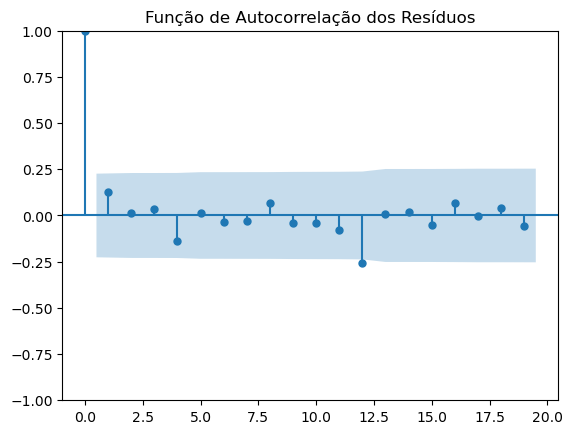

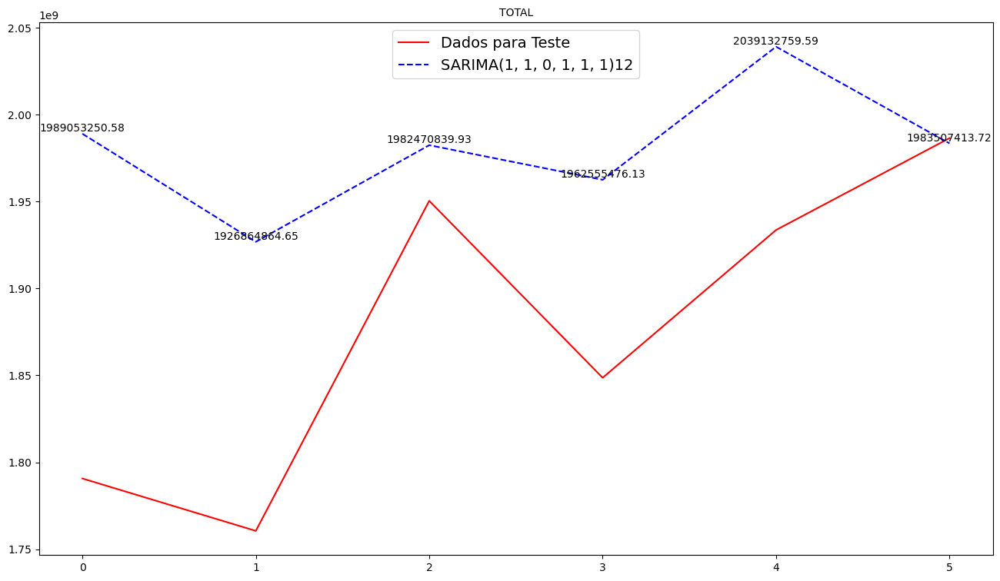

In [ ]:
ordens = [(2,1,1),(1,1,1),(1,1,2),(2,1,2),(0,1,1),(1,1,0),(1,1,3)]
seasonal_ordens = [(1,1,1),(1,1,2),(0,0,0),(1,0,0)]
steps = 6
i = 0
best_params_dict = {}
forecasts = {}

for coluna in ZtModel.columns:
    predictions_name = f"predictions{i}"
    exec(f"{predictions_name} = []") # Armazenar as previsões futuras

    data_treino = ZtModel[coluna]
    data_teste = ZtTest[coluna]

    best_params, _, forecast = find_best_sarima_parameters(ordens, seasonal_ordens, data_treino, steps)
    eval(f"{predictions_name}.append(forecast.values)")

    best_params_dict[f'best_params_{i}'] = best_params

    i = i + 1
    plot_forecast(data_teste.values, forecast.values, best_params, name = data_teste.name)

In [ ]:
df = pd.DataFrame.from_dict(best_params_dict, orient='index', columns=['Parametro1', 'Parametro2', 'Parametro3', 'Parametro4', 'Parametro5', 'Parametro6'])
df.to_excel('parametrosSarima.xlsx', index_label='ID')

In [ ]:
import numpy as np

predictions_list = [predictions0, predictions1, predictions2, predictions3, predictions4,
                    predictions5, predictions6, predictions7, predictions8, predictions9,
                    predictions10, predictions11, predictions12, predictions13, predictions14,
                    predictions15, predictions16, predictions17, predictions18]

# Somando os arrays elemento por elemento
summed_predictions = np.sum(predictions_list, axis=0)
summed_predictions = summed_predictions.flatten() # Dirando o 2D e deixando 1D
print(summed_predictions)


[1.82940643e+09 1.81644386e+09 1.81915519e+09 1.79429388e+09
 1.83761432e+09 1.79178470e+09]


In [ ]:
mape = mean_absolute_percentage_error(ZtTest['TOTAL'].values, summed_predictions)*100
mae = mean_absolute_error(ZtTest['TOTAL'].values, summed_predictions)
rmse = math.sqrt(mean_squared_error(ZtTest['TOTAL'].values, summed_predictions))

print(f'Modelo SARIMA SOMA: MAPE = {mape};  rmse = {rmse} ;  mae = {mae}')

Modelo SARIMA SOMA: MAPE = 4.963449482290499;  rmse = 109523645.21873097 ;  mae = 95180577.52871998


In [ ]:
mape = mean_absolute_percentage_error(np.squeeze(predictions19), summed_predictions)*100
mae = mean_absolute_error(np.squeeze(predictions19), summed_predictions)
rmse = math.sqrt(mean_squared_error(np.squeeze(predictions19), summed_predictions))

print(f'Modelo SARIMA ICMS: MAPE = {mape};  rmse = {rmse} ;  mae = {mae}')

Modelo SARIMA ICMS: MAPE = 8.352809593398185;  rmse = 168340504.4622953 ;  mae = 165814371.1730298


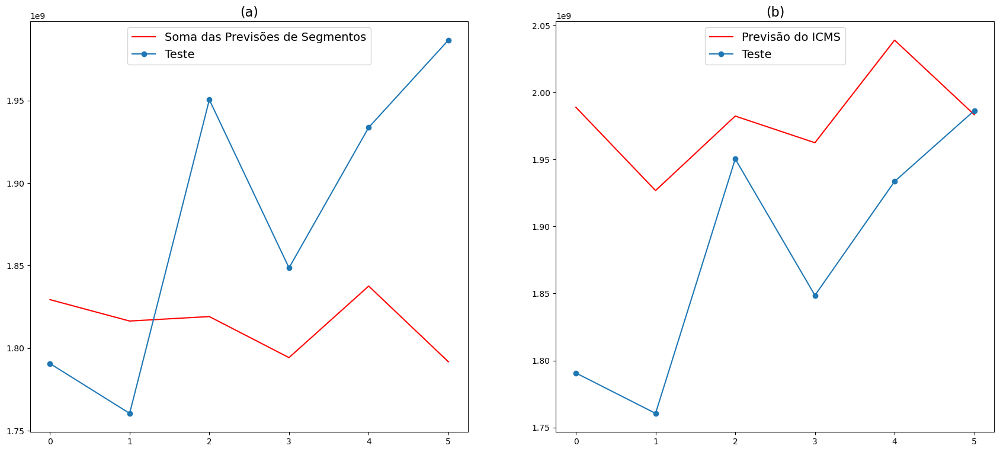

In [ ]:
plt.figure(figsize=(21, 9))

plt.subplot(1,2,1)
plt.plot(summed_predictions, 'r-')
plt.plot(ZtTest['TOTAL'].values, 'o-')


legend = ('Soma das Previsões de Segmentos','Teste')
plt.legend(legend, loc = 'upper center', prop = {'size': 14})
plt.title('(a)', fontsize=16)  # Adicionando o título (a)

plt.subplot(1,2,2)
plt.plot(np.squeeze(predictions19), 'r-')
plt.plot(ZtTest['TOTAL'].values, 'o-')

legenda = ('Previsão do ICMS', 'Teste')
plt.legend(legenda, loc = 'upper center', prop = {'size': 14})
plt.title('(b)', fontsize=16)

plt.show()